**Predmet:** Principi prezentacije i prepoznavanja oblika

**Student:** Una Obradović IT-56/2019

**Tema:** Detekcija objekata - brodova

---

# **Sadržaj**

1. Uvod
2. Opis projektnog zadatka  
3. Realizacija zadatka
4. Analiza rezultata
5. Zaključak
6. Literatura
---

### 1. Uvod

Mašinsko učenje je brzo rastuće područje veštačke inteligencije koje uključuje razvoj tehnika i metoda koje omogućavaju računarima i drugim mašinama da uče na osnovu iskustva, bez eksplicitnog programiranja. Jednostavnije rečeno, mašinsko učenje se zasniva na ideji da postoje generički algoritmi koji nam mogu reći nešto interesantno o skupu podataka, a da pritom ne moramo da napišemo poseban kod za taj problem. Podaci se ubace u algoritam, a on stvara svoju logiku na osnovu podataka.

Jedna od ključnih prednosti mašinskog učenja je njegova sposobnost da rešava složene probleme koji bi bili teški ili nemogući za ljude da reše ručno. Na primer, mašinsko učenje je uspešno primenjeno na zadatke kao što su prepoznavanje lica, prepoznavanje objekata na slikama i videu, otkrivanje tumora na medicinskim slikama, autonomna vožnja, autonomno letenje, igranje društvenih igara poput šaha i Go, kao i računarskih igara poput Super Maria ili Dooma, klasifikacija teksta, mašinsko prevođenje, automatsko opisivanje sadržaja slika, analiza osećanja, predviđanje razvoja bolesti kod pacijenata i preporučivanje terapije, analiza društvenih mreža, prepoznavanje i sinteza govora i mnoge druge.

Postoje tri glavne vrste problema mašinskog učenja: nadgledano učenje, nenadgledano učenje i učenje potkrepljivanjem. U nadgledanom učenju, algoritam se trenira na označenom skupu podataka, gde je tačan izlaz poznat za svaki ulaz. Algoritam uči da mapira ulaze na izlaze minimizirajući razliku između njegovog predviđenog izlaza i tačnog izlaza. U nenadgledanom učenju, algoritam se trenira na neoznačenom skupu podataka, gde tačan izlaz nije poznat. Algoritam uči da pronađe obrasce i strukturu u podacima grupisanjem sličnih tačaka podataka zajedno. U učenju potkrepljivanjem, algoritam uči da donosi odluke interakcijom sa okruženjem i dobijanjem povratnih informacija u obliku nagrada ili kazni.

Jedan od najpoznatijih zadataka nadgledanog mašinskog učenja je **klasifikacija**. Klasifikacija se sastoji u razvrstavanju nepoznate instance u jednu od unapred ponuđenih kategorija, tj. klasa. Neki od primera klasifikacije su razvrstavanje bankovnih transakcija u rizične, koje mogu predstavljati prevaru ili u nerizične, koje predstavljaju uobičajene transakcije, određivanje autorstva tekstova pri čemu se tekstu nepoznatog autora pridružuje jedan od nekoliko unapred ponuđenih autora, razvrstavanje elektronske pošte u željenu i neželjenu i slično. U navedenim primerima, svakoj instanci (bankovna transakcija, tekst,
elektronska poruka) odgovara vektor vrednosti nekih izabranih svojstava. Svakoj instanci takođe odgovara i oznaka klase kojoj ta instanca pripada.  [3]


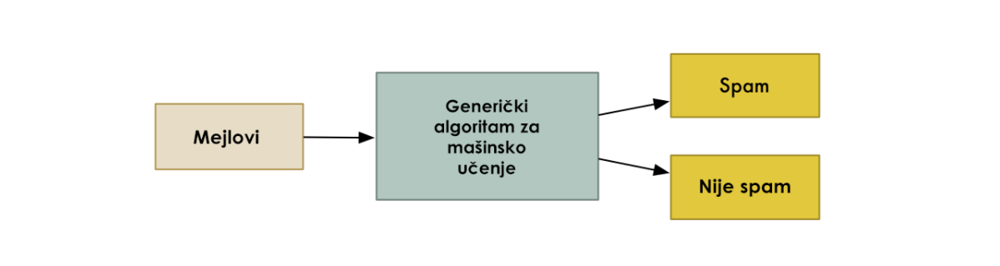

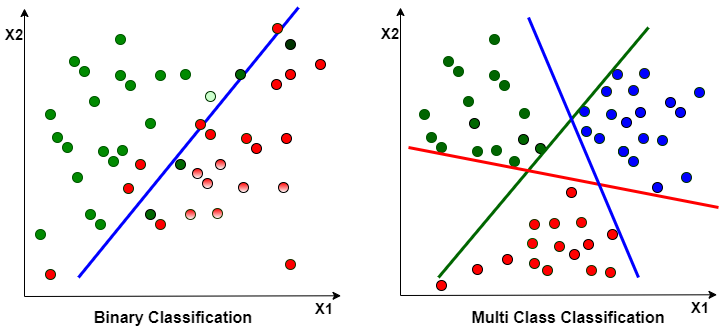

**Detekcija** (detektovanje anomalija) je identifikacija retkih pojava, događaja ili zapažanja koja izazivaju određenu sumnju jer se značajno razlikuju od većine podataka. Obično se takvi podaci mogu povezati s nekom vrstom problema ili retkim događajem, kao što je npr. bankarska prevara, medicinski problemi, strukturni nedostaci, neispravna oprema itd. Ova veza čini vrlo zanimljivim mogućnost odabira koje se tačke podataka mogu smatrati anomalijama, budući da je identifikovanje ovih događaja veoma interesantno iz poslovne perspektive.

Jedno od ključnih pitanja koje se postavlja je kako da identifikujemo da li su podaci normalni ili predstavljaju neku vrstu anomalije. U nekim jednostavnim slučajevima, kao na slici ispod, vizualizacija podataka može nam dati veoma važne informacije.

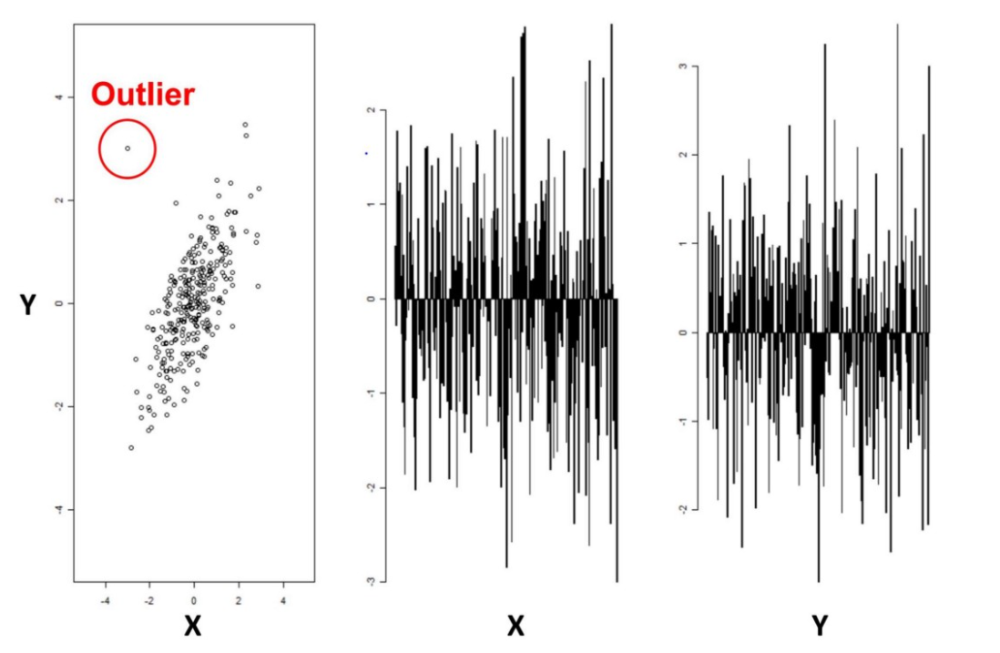

U ovom slučaju dvodimenzionalnih podataka (X i Y) postaje prilično lako vizuelno identifikovati anomalije kroz tačke podataka (**outliers**) koje se nalaze izvan tipične distribucije. Međutim, gledajući histograme s desne strane, nije moguće identifikovati outlier direktno iz istraživanja jedne promenljive već nam kombinacija promenljivih X i Y omogućava da lako identifikujemo anomaliju.

Ovo značajno komplikuje stvar kada povećamo sa dve promenljive na 10–100 varijabli, što je često slučaj u praktičnim primenama otkrivanja anomalija.

### 2. Opis projektnog zadatka

Osnovni zadatak je detektovanje i klasifikacija brodova na fotografijama iz ptičije perspektive. Potrebno je predvideti lokaciju broda, kako bi te informacije na neki način doprinele praćenju brodova iz vazduha. Svaka slika iz skupa koji se koristi ima svoj jedinstveni id i postoje slike koje nemaju nijedan brod prisutan, kao i slike koje imaju tačno jedan ili više prisutnih brodova na njima, međusobno blizu ili daleko. Primeri fotografija brodova koje se koriste su dati ispod.

Za realizaciju zadatka koristi se dataset koji se nalazi na sledećoj lokaciji:

https://drive.google.com/file/d/1VHbj77uYVjcEh9_e4Y6wgpIMI-8Q2YBo/view?fbclid=IwAR3TLslBnsbR8fpLA-g8KA9QaYYA8pT2V0Y6QQI0-q8Q7VGdt0TLUHOrIc4.

Dobijeni dataset se sastoji od:

*   **train_v2 foldera** - obuhvata slike koje se koriste za treniranje modela. U ovom folderu se nalazi 44533 slika.
*   **test_v2 foldera** - obuhvata slike za testiranje modela. Osnovni cilj je detektovati brodove na tim slikama. U ovom folderu se nalazi 6872 slika.
*   **train_ship_segmentations_v2.csv** - fajl koji sadrži podatke za obuku. Ima dve kolone: *ImageId*, i *EncodedPixels*.
*   **sample_submission_v2.csv** - primer kako treba da izgleda format fajla kao rešenje zadatka

### 3. Realizacija zadatka

Za projekat su podaci downloadovani i sacuvani u ./data folderu.

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1swD3_-acnDAOigOiZlKlf-a5OPw7ebNS' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1swD3_-acnDAOigOiZlKlf-a5OPw7ebNS" -O images.zip && rm -rf /tmp/cookies.txt

--2022-09-11 16:20:29--  https://docs.google.com/uc?export=download&confirm=t&id=1swD3_-acnDAOigOiZlKlf-a5OPw7ebNS
Resolving docs.google.com (docs.google.com)... 173.194.217.102, 173.194.217.100, 173.194.217.113, ...
Connecting to docs.google.com (docs.google.com)|173.194.217.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vfti39ltc5kvn2jseh53vdekotos9rqj/1662913200000/06049624160957438625/*/1swD3_-acnDAOigOiZlKlf-a5OPw7ebNS?e=download&uuid=c93500f5-e799-4238-847a-246dcf41ee75 [following]
--2022-09-11 16:20:29--  https://doc-0g-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vfti39ltc5kvn2jseh53vdekotos9rqj/1662913200000/06049624160957438625/*/1swD3_-acnDAOigOiZlKlf-a5OPw7ebNS?e=download&uuid=c93500f5-e799-4238-847a-246dcf41ee75
Resolving doc-0g-64-docs.googleusercontent.com (doc-0g-64-docs.googleusercontent.com)... 74.125.28.13

In [ ]:
!unzip images.zip

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
PATH = "./data/"
TRAIN_PATH = PATH + "train_v2/"
TEST_PATH = PATH + "test_v2/"

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

RLE enkoder i dekoder  na osnovu EncodedPixels vrednosti za sliku

Ove funkcije omogućavaju kompaktno kodiranje i dekodiranje maski koje se često koriste u analizi slika i segmentaciji objekata.

In [ ]:
def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return
    Returns numpy array, 1 - mask, 0 - background
    '''
    if type(mask_rle) != str: # Za slucaj da je vrednost NaN kada nema maske na slici
        return np.zeros(shape)
    else:
        s = mask_rle.split()
        starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
        starts -= 1
        ends = starts + lengths
        img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
        for lo, hi in zip(starts, ends):
            img[lo:hi] = 1
        return img.reshape(shape).T

čitanje CSV datoteke koja sadrži informacije o segmentaciji brodova

In [ ]:
masks = pd.read_csv(PATH + "train_ship_segmentations_v2.csv")

 pronalaženje i popisivanje svih datoteka koje se nalaze u određenom direktorijumu TRAIN_PATH

In [ ]:
found_images = os.listdir(TRAIN_PATH)

filtriranje DataFrame-a masks kako bi se zadržali samo redovi čiji se 'ImageId' nalazi u listi found_images

In [ ]:
masks = masks.drop(masks[~masks['ImageId'].isin(found_images)].index)

Ceo kod kombinuje sliku sa pripadajućom maskom kako bi se prikazala vizualizacija segmentacije na slici '000155de5.jpg'. Ovo je čest korak u analizi slika i računalnom vidu kako bi se proverila tačnost algoritama za segmentaciju objekata.

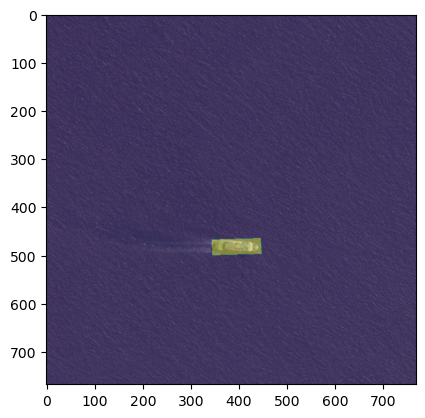

In [ ]:
test_mask = masks.loc[masks['ImageId'] == '000155de5.jpg']['EncodedPixels']
decode = rle_decode(test_mask.iloc[0])
test_img = skimage.io.imread(PATH + 'train_v2/000155de5.jpg')
plt.imshow(test_img)
plt.imshow(decode, alpha = 0.4)

Ova funkcija je za pripremu podataka za treniranje modela za zadatke u računarstvu, kao što je segmentacija objekata na slikama.

In [ ]:
def image_gen(df, show = False):
    images = list(df['ImageId'])
    masks = list(df['EncodedPixels'])
    i = 0
    while i < len(images):
        img = skimage.io.imread(TRAIN_PATH + images[i])
        mask = np.reshape(rle_decode(masks[i]),(768,768,1))
        if show == True:
            plt.imshow(img)
            plt.imshow(mask, alpha = 0.4)
        yield (np.array([img/255]), np.array([mask]))
        i += 1

Ovaj blok koda se koristi za kombinovanje više maski za istu sliku u jednu masku, kada postoji više maski za istu sliku u DataFrame-u masks. Nakon što je proces završen, mu će sadržavati slike sa sada većim brojem maski koje su kombinovane u jednu.

In [ ]:
masks['count'] = masks.groupby('ImageId')['EncodedPixels'].transform('count')
masks.set_index('ImageId', inplace = True)
mu = masks[masks['count'] <= 1]
mm = masks[masks['count'] > 1]
for mult in tqdm(mm.index.unique()):
    combined = np.zeros((768, 768))
    dfm = mm.loc[mult,:]
    for i, row in dfm.iterrows():
        d = rle_decode(row['EncodedPixels'])
        combined = np.maximum(combined, d)
    new_row = row
    new_row['EncodedPixels'] = rle_encode(combined)
    mu = mu.append(new_row)


100%|███████████████████████████████████████| 3593/3593 [00:53<00:00, 67.69it/s]


In [ ]:
mu.reset_index(inplace = True)

Ovaj deo koda izgleda kao da se kreira nekoliko novih DataFrame-ova (m01, m02, m03, itd.) koji sadrže određeni broj redova iz DataFrame-a mu na osnovu kriterijuma broja maski ('count').

In [ ]:


m01 = mu[mu['count'] == 0].iloc[0,:]
m02 = mu[mu['count'] == 0].iloc[1,:]
m03 = mu[mu['count'] == 0].iloc[2,:]

m11 = mu[mu['count'] == 1].iloc[0,:]
m12 = mu[mu['count'] == 1].iloc[1,:]
m13 = mu[mu['count'] == 1].iloc[2,:]

m21 = mu[mu['count'] == 2].iloc[0,:]
m22 = mu[mu['count'] == 2].iloc[1,:]
m23 = mu[mu['count'] == 2].iloc[2,:]

m31 = mu[mu['count'] == 3].iloc[0,:]
m32 = mu[mu['count'] == 3].iloc[1,:]
m33 = mu[mu['count'] == 3].iloc[2,:]

m41 = mu[mu['count'] == 4].iloc[0,:]
m42 = mu[mu['count'] == 4].iloc[1,:]
m43 = mu[mu['count'] == 4].iloc[2,:]

m51 = mu[mu['count'] == 5].iloc[0,:]
m52 = mu[mu['count'] == 5].iloc[1,:]
m53 = mu[mu['count'] == 5].iloc[2,:]

In [ ]:
m01_img = skimage.io.imread(TRAIN_PATH + m01['ImageId'])
m02_img = skimage.io.imread(TRAIN_PATH + m02['ImageId'])
m03_img = skimage.io.imread(TRAIN_PATH + m03['ImageId'])

m11_img = skimage.io.imread(TRAIN_PATH + m11['ImageId'])
m12_img = skimage.io.imread(TRAIN_PATH + m12['ImageId'])
m13_img = skimage.io.imread(TRAIN_PATH + m13['ImageId'])

m21_img = skimage.io.imread(TRAIN_PATH + m21['ImageId'])
m22_img = skimage.io.imread(TRAIN_PATH + m22['ImageId'])
m23_img = skimage.io.imread(TRAIN_PATH + m23['ImageId'])

m31_img = skimage.io.imread(TRAIN_PATH + m31['ImageId'])
m32_img = skimage.io.imread(TRAIN_PATH + m32['ImageId'])
m33_img = skimage.io.imread(TRAIN_PATH + m33['ImageId'])

m41_img = skimage.io.imread(TRAIN_PATH + m41['ImageId'])
m42_img = skimage.io.imread(TRAIN_PATH + m42['ImageId'])
m43_img = skimage.io.imread(TRAIN_PATH + m43['ImageId'])

m51_img = skimage.io.imread(TRAIN_PATH + m51['ImageId'])
m52_img = skimage.io.imread(TRAIN_PATH + m52['ImageId'])
m53_img = skimage.io.imread(TRAIN_PATH + m53['ImageId'])

Ova linija koda postavlja veličinu slika koje će se generisati pomoću matplotlib.pyplot. Konkretno, postavlja veličinu slika na 20x20 inča. Ovo će uticati na sve buduće slike koje se kreiraju i prikazuju pomoću matplotlib

In [ ]:
plt.rcParams["figure.figsize"] = (20,20)

Ovaj blok koda kreira mrežu slika (6x3) u kojoj svaki par slika prikazuje sliku i odgovarajuću masku sa poluprozirnošću

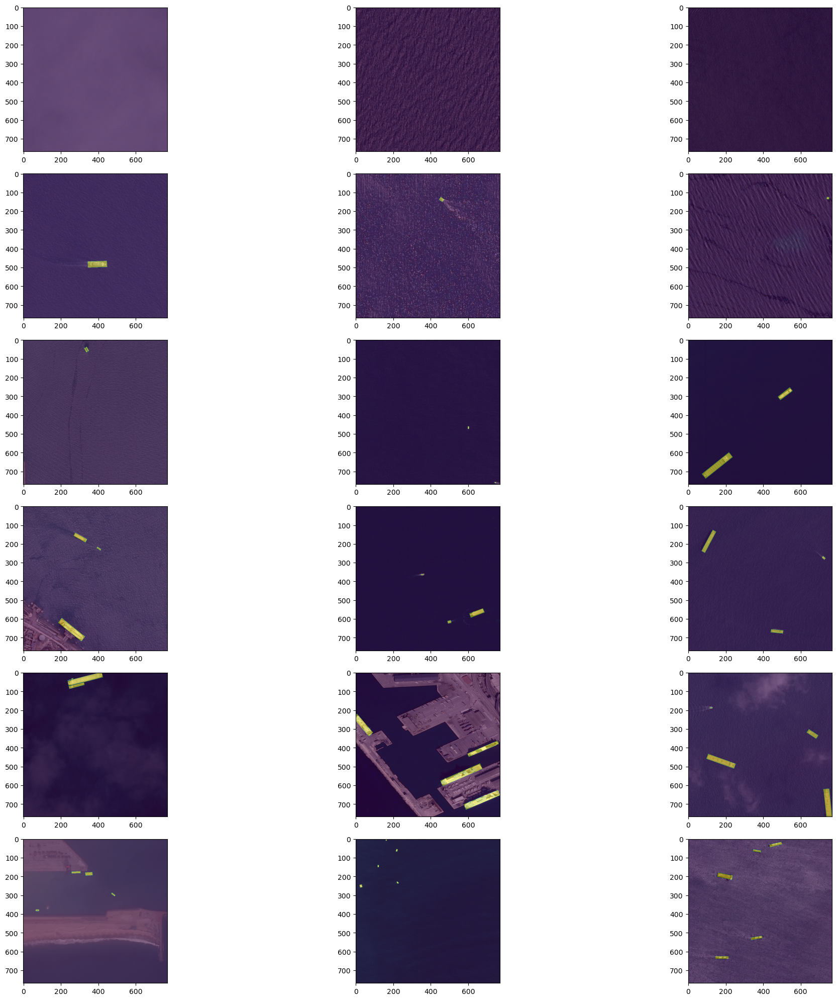

In [ ]:
from skimage.util import montage

fig, ((ax1, ax2, ax3),
      (ax4, ax5, ax6),
      (ax7, ax8, ax9),
      (ax10, ax11, ax12),
      (ax13, ax14, ax15),
      (ax16, ax17, ax18)) = plt.subplots(6,3)
plt.tight_layout()

ax1.imshow(m01_img)
ax1.imshow(rle_decode(m01['EncodedPixels']), alpha = 0.5)
ax2.imshow(m02_img)
ax2.imshow(rle_decode(m02['EncodedPixels']), alpha = 0.5)
ax3.imshow(m03_img)
ax3.imshow(rle_decode(m03['EncodedPixels']), alpha = 0.5)

ax4.imshow(m11_img)
ax4.imshow(rle_decode(m11['EncodedPixels']), alpha = 0.5)
ax5.imshow(m12_img)
ax5.imshow(rle_decode(m12['EncodedPixels']), alpha = 0.5)
ax6.imshow(m13_img)
ax6.imshow(rle_decode(m13['EncodedPixels']), alpha = 0.5)

ax7.imshow(m21_img)
ax7.imshow(rle_decode(m21['EncodedPixels']), alpha = 0.5)
ax8.imshow(m22_img)
ax8.imshow(rle_decode(m22['EncodedPixels']), alpha = 0.5)
ax9.imshow(m23_img)
ax9.imshow(rle_decode(m23['EncodedPixels']), alpha = 0.5)

ax10.imshow(m31_img)
ax10.imshow(rle_decode(m31['EncodedPixels']), alpha = 0.5)
ax11.imshow(m32_img)
ax11.imshow(rle_decode(m32['EncodedPixels']), alpha = 0.5)
ax12.imshow(m33_img)
ax12.imshow(rle_decode(m33['EncodedPixels']), alpha = 0.5)

ax13.imshow(m41_img)
ax13.imshow(rle_decode(m41['EncodedPixels']), alpha = 0.5)
ax14.imshow(m42_img)
ax14.imshow(rle_decode(m42['EncodedPixels']), alpha = 0.5)
ax15.imshow(m43_img)
ax15.imshow(rle_decode(m43['EncodedPixels']), alpha = 0.5)

ax16.imshow(m51_img)
ax16.imshow(rle_decode(m51['EncodedPixels']), alpha = 0.5)
ax17.imshow(m52_img)
ax17.imshow(rle_decode(m52['EncodedPixels']), alpha = 0.5)
ax18.imshow(m53_img)
ax18.imshow(rle_decode(m53['EncodedPixels']), alpha = 0.5)

Pregled balansa podataka, u našem slučaju nije bitan jer imamo samo jednu klasu

Podela podataka na 80% za treniranje i 20% za testiranje.

<AxesSubplot: >

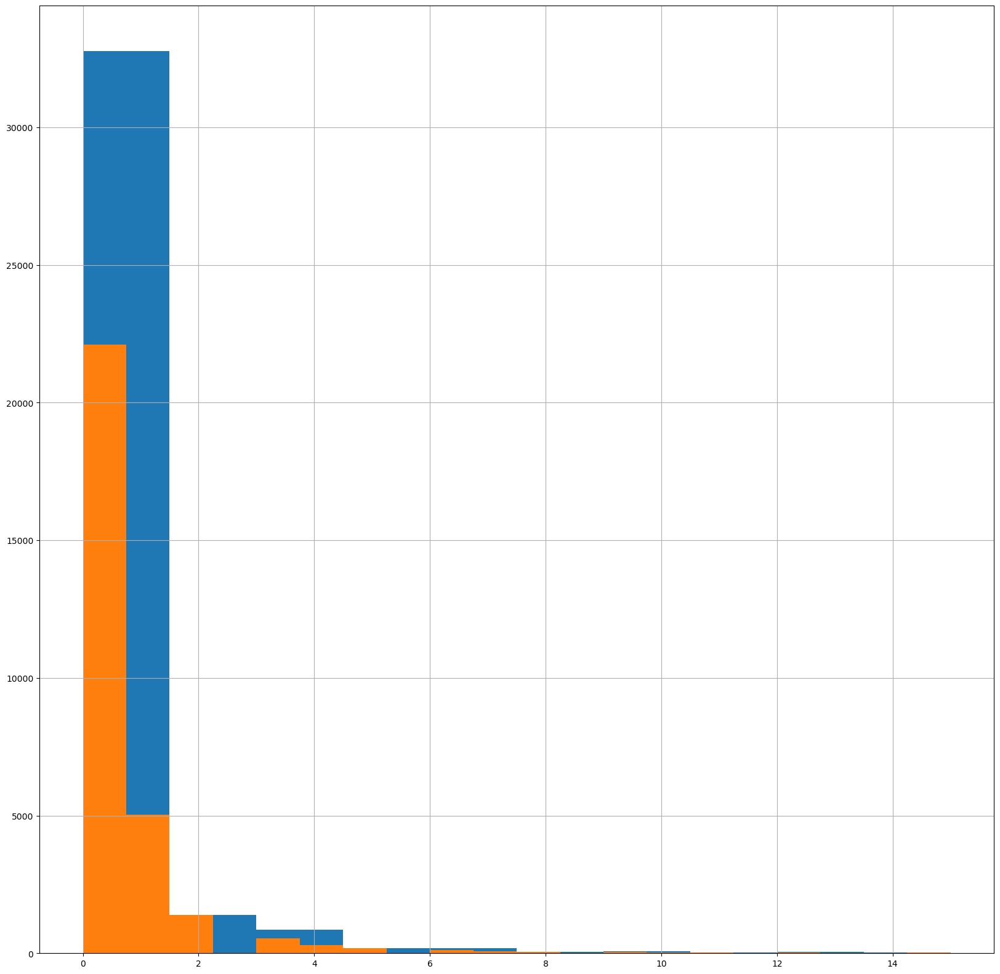

In [ ]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(mu, test_size = 0.2, shuffle=True)

df_train['count'].hist()

df_train['freq'] = df_train.groupby('count')['count'].transform('count')

df_sample = df_train.sample(n = 30000, weights = 1/(df_train['freq'].pow(1.5)))

df_sample['count'].hist(bins=20)

Ovaj blok koda se koristi za generisanje trening i test skupova podataka za treniranje i testiranje modela za segmentaciju objekata na slikama.

In [ ]:
train_gen = image_gen(df_sample)
X_train, y_train = next(train_gen)
print(np.shape(X_train), np.shape(y_train))

test_gen = image_gen(df_test)
X_test, y_test = next(test_gen)

(1, 768, 768, 3) (1, 768, 768, 1)


Sledeći korak je izvršavanje **augmentacije** slika.

To je tehnika koja se može koristiti za veštačko proširenje veličine skupa za obuku stvaranjem izmenjenih podataka od postojećeg. Dobra je praksa da se koristi Data Augmentation ako želimo da sprečimo *overfitting*, ili je početni skup podataka premali za obuku, ili ako želimo da iz svog modela dobijemo bolje performanse. Povećanje podataka ne koristi se samo za sprečavanje overfitting-a. Uopšteno govoreći, veliki skup podataka je presudan za performanse i modela mašinskog učenja i modela dubokog učenja. Međutim, performanse modela možemo poboljšati povećanjem podataka koje već imamo. [14]

Data Augmentation tehnike (primer slika ispod):

1. Geometrijske transformacije

2. Transformacije prostora boja

3. Kernel filteri

4. Slučajno brisanje

5. Mešanje slika

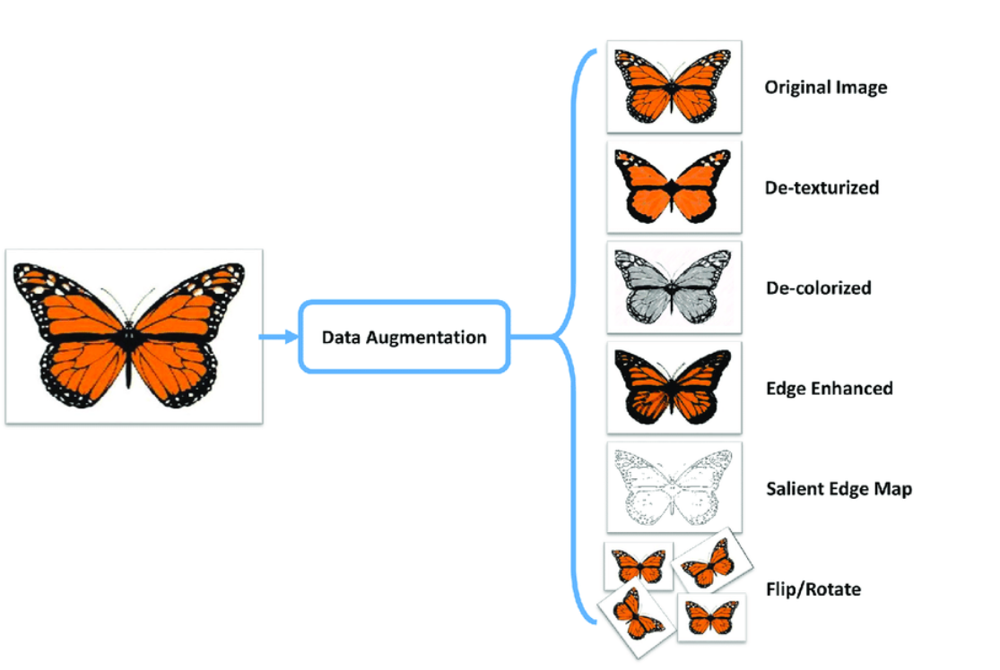

Ovaj blok koda definiše parametre za generisanje uvećanih (augmented) slika pomoću biblioteke Keras za obradu slika.
Ovi parametri se obično koriste za generisanje različitih verzija slika za obuku modela kako bi se poboljšala robusnost modela i omogućilo bolje generalizovanje na različite vrste transformacija i varijacija u slikama.

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

dg_args = dict(featurewise_center = False,
                  samplewise_center = False,
                  rotation_range = 15,
                  width_shift_range = 0.1,
                  height_shift_range = 0.1,
                  shear_range = 0.01,
                  zoom_range = [0.9, 1.25],
                  horizontal_flip = True,
                  vertical_flip = True,
                  fill_mode = 'reflect',
                  data_format = 'channels_last',
                  brightness_range = [0.5, 1.5],
              dtype=float)

In [ ]:
im_gen = ImageDataGenerator(**dg_args)

dg_args.pop('brightness_range')
mask_gen = ImageDataGenerator(**dg_args)

In [ ]:
import tensorflow as tf

Ovaj kod se koristi za vizualizaciju uvećanih verzija slika i maski iz trening skupa podataka, što može pomoći u proveri efekta uvećanja na podatke i boljem razumevanju kako će model reagovati na različite transformacije slika tokom obuke.

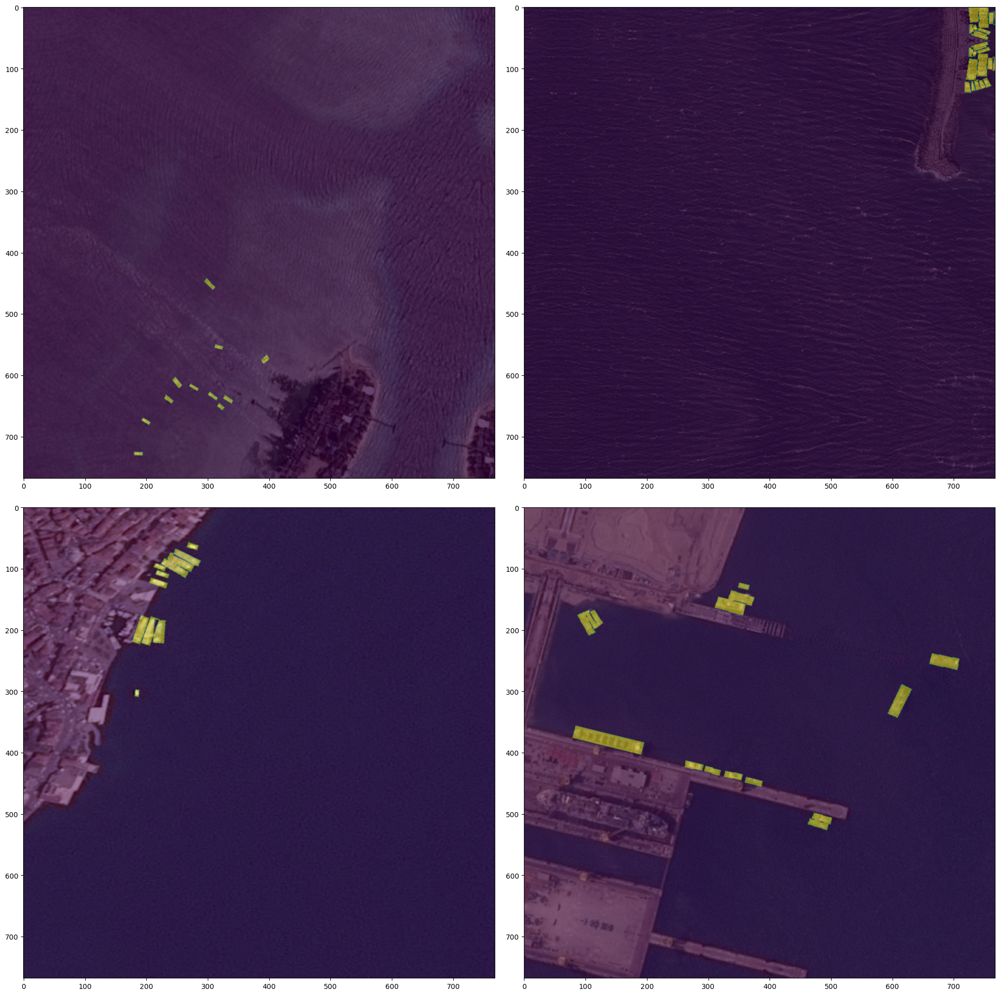

In [ ]:
test_aug = aug_gen(image_gen(df_sample[df_sample['count'] > 2]))

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2)
plt.tight_layout()

tax1, tay1 = next(test_aug)
ax1.imshow(tax1[0])
ax1.imshow(np.reshape(tay1[0], (768,768)), alpha = 0.5)

tax2, tay2 = next(test_aug)
ax2.imshow(tax2[0])
ax2.imshow(np.reshape(tay2[0], (768,768)), alpha = 0.5)

tax3, tay3 = next(test_aug)
ax3.imshow(tax3[0])
ax3.imshow(np.reshape(tay3[0], (768,768)), alpha = 0.5)

tax4, tay4 = next(test_aug)
ax4.imshow(tax4[0])
ax4.imshow(np.reshape(tay4[0], (768,768)), alpha = 0.5)

Kreiranje modela

In [ ]:
import skimage.io as io
import skimage.transform as trans
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras
import keras.backend as K
from keras.losses import binary_crossentropy
from keras.models import Model
from keras.callbacks import CSVLogger
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

In [ ]:
def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)

In [ ]:
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

In [ ]:
def dice_p_bce(in_gt, in_pred):
    return 1e-3*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)

Ova funkcija definiše i kompajlira UNet model za segmentaciju slika i može se koristiti za obuku i primenu na odgovarajućim podacima za segmentaciju objekata na slikama.

In [ ]:
def unet(pretrained_weights = None,input_size = (256,256,1)):
    inputs = Input(input_size)

    pp_in_layer = inputs

    pp_in_layer = GaussianNoise(0.1)(pp_in_layer)
    pp_in_layer = BatchNormalization()(pp_in_layer)
    conv1 = Conv2D(8, 3, activation = 'relu', padding = 'same')(pp_in_layer)
    conv1 = Conv2D(8, 3, activation = 'relu', padding = 'same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(16, 3, activation = 'relu', padding = 'same')(pool1)
    conv2 = Conv2D(16, 3, activation = 'relu', padding = 'same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(32, 3, activation = 'relu', padding = 'same')(pool2)
    conv3 = Conv2D(32, 3, activation = 'relu', padding = 'same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(64, 3, activation = 'relu', padding = 'same')(pool3)
    conv4 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)
    conv5 = Conv2D(128, 3, activation = 'relu', padding = 'same')(pool4)
    conv5 = Conv2D(128, 3, activation = 'relu', padding = 'same')(conv5)
    drop5 = Dropout(0.5)(conv5)
    up6 = Conv2D(64, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(64, 3, activation = 'relu', padding = 'same')(merge6)
    conv6 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv6)
    up7 = Conv2D(32, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(32, 3, activation = 'relu', padding = 'same')(merge7)
    conv7 = Conv2D(32, 3, activation = 'relu', padding = 'same')(conv7)
    up8 = Conv2D(16, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(16, 3, activation = 'relu', padding = 'same')(merge8)
    conv8 = Conv2D(16, 3, activation = 'relu', padding = 'same')(conv8)
    up9 = Conv2D(8, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(8, 3, activation = 'relu', padding = 'same')(merge9)
    conv9 = Conv2D(8, 3, activation = 'relu', padding = 'same')(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same')(conv9)
    conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)

    model = Model(inputs, conv10)

    model.compile(optimizer=Adam(1e-4, decay=1e-6), loss=dice_p_bce, metrics=['binary_accuracy', true_positive_rate])
    if(pretrained_weights):
        model.load_weights(pretrained_weights)
    return model

In [ ]:
model = unet(input_size = np.shape(X_train)[1:])

Ovaj blok koda definiše tri callback funkcije koje se koriste tokom obuke modela za segmentaciju slika.
Na kraju, ove callback funkcije se dodaju u listu callbacks_list, koja se kasnije koristi prilikom obuke modela kako bi se aktivirale ove callback funkcije i pratio napredak obuke.

In [ ]:
checkpoint = ModelCheckpoint("checkpoints.out", monitor='accuracy',
                             verbose=1, save_best_only=True, mode='max')

csv_logger = CSVLogger("log.out", append=True, separator=';')

earlystopping = EarlyStopping(monitor = 'accuracy', verbose = 1,
                              min_delta = 0.01, patience = 3, mode = 'max')

callbacks_list = [checkpoint, csv_logger, earlystopping]

Ove promenljive definišu parametre obuke za model za segmentaciju slika. Evo šta svaka od njih znači:

**STEPS**: Ovo je broj koraka (batches) koji će se izvršiti tokom svake epohe obuke. Jedan korak predstavlja procesiranje jednog batch-a podataka. U ovom slučaju, postavljeno je da će se izvršiti 200 koraka po epohi.

**BATCH_SIZE**: Ovo je broj uzoraka (slika i maski) koji će se koristiti u svakom batch-u tokom obuke. Veći batch size može ubrzati obuku, ali zahteva više resursa. U ovom slučaju, postavljeno je da će se koristiti batch size od 20.

**EPOCHS**: Ovo je broj epoha koje će se izvršiti tokom obuke. Epoha predstavlja jedno prolazak kroz ceo trening skup podataka. U ovom slučaju, postavljeno je da će se izvršiti 10 epoha.

In [ ]:
STEPS = 200
EPOCHS = 10
BATCH_SIZE = 20

Ova linija koda obavlja trening modela za segmentaciju slika koristeći generatore podataka

In [ ]:
results = model.fit_generator(aug_gen(image_gen(df_sample)),
                              epochs = EPOCHS,
                              steps_per_epoch = 1,
                              validation_data = image_gen(df_test),
                              validation_steps = 50,
                              callbacks = callbacks_list,
                              workers = 1)

Epoch 1/10
1/1 [==============================] - 16s 16s/step - loss: -0.0027 - binary_accuracy: 0.6456 - true_positive_rate: 0.4145 - val_loss: -0.0018 - val_binary_accuracy: 0.6260 - val_true_positive_rate: nan
Epoch 2/10
1/1 [==============================] - 14s 14s/step - loss: -0.0278 - binary_accuracy: 0.6338 - true_positive_rate: 0.4499 - val_loss: -0.0013 - val_binary_accuracy: 0.4266 - val_true_positive_rate: nan
Epoch 3/10
1/1 [==============================] - 15s 15s/step - loss: -0.0121 - binary_accuracy: 0.6960 - true_positive_rate: 0.3674 - val_loss: -0.0015 - val_binary_accuracy: 0.3294 - val_true_positive_rate: nan
Epoch 4/10
1/1 [==============================] - 15s 15s/step - loss: 6.9065e-04 - binary_accuracy: 0.6096 - true_positive_rate: nan - val_loss: -6.4856e-04 - val_binary_accuracy: 0.2656 - val_true_positive_rate: nan
Epoch 5/10
1/1 [==============================] - 14s 14s/step - loss: -0.0319 - binary_accuracy: 0.6639 - true_positive_rate: 0.3883 - val_

In [ ]:
model.save('ships_weights.h5')

Grafik prikazuje kako se gubitak na trening i validacionom skupu menja tokom epoha. Linija 'loss' predstavlja gubitak na trening skupu, dok linija 'val_loss' predstavlja gubitak na validacionom skupu. Očekuje se da ove linije opadaju tokom obuke, što bi ukazivalo na poboljšanje performansi modela. Grafik pomaže u praćenju i vizualizaciji kako se model ponaša tokom obuke.

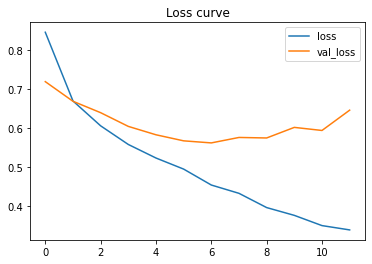

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title = 'Loss curve')

Upotreba modela

In [ ]:
from keras import models

In [ ]:
model = models.load_model('./ships_weights.h5', custom_objects={ 'dice_p_bce': dice_p_bce , 'true_positive_rate': true_positive_rate})

Ove funkcije olakšavaju vizualizaciju rezultata modela za segmentaciju, omogućavajući analizu kako model predviđa maske na slikama.

In [ ]:
def plot_mask(mask, alpha = 1):
    m = np.reshape(mask[0],(768,768))
    plt.imshow(m, alpha = alpha)

def plot_im(image):
    plt.imshow(image[0])

def plot_overlay(image, mask):
    plot_im(image)
    plot_mask(mask, alpha = 0.3)

In [ ]:
test_gen = image_gen(df_test)

Ovaj blok koda omogućava vizualizaciju kako model radi na više testnih slika, prikazujući originalne slike, stvarne maske (ako su dostupne) i predviđene maske.

0
1
2


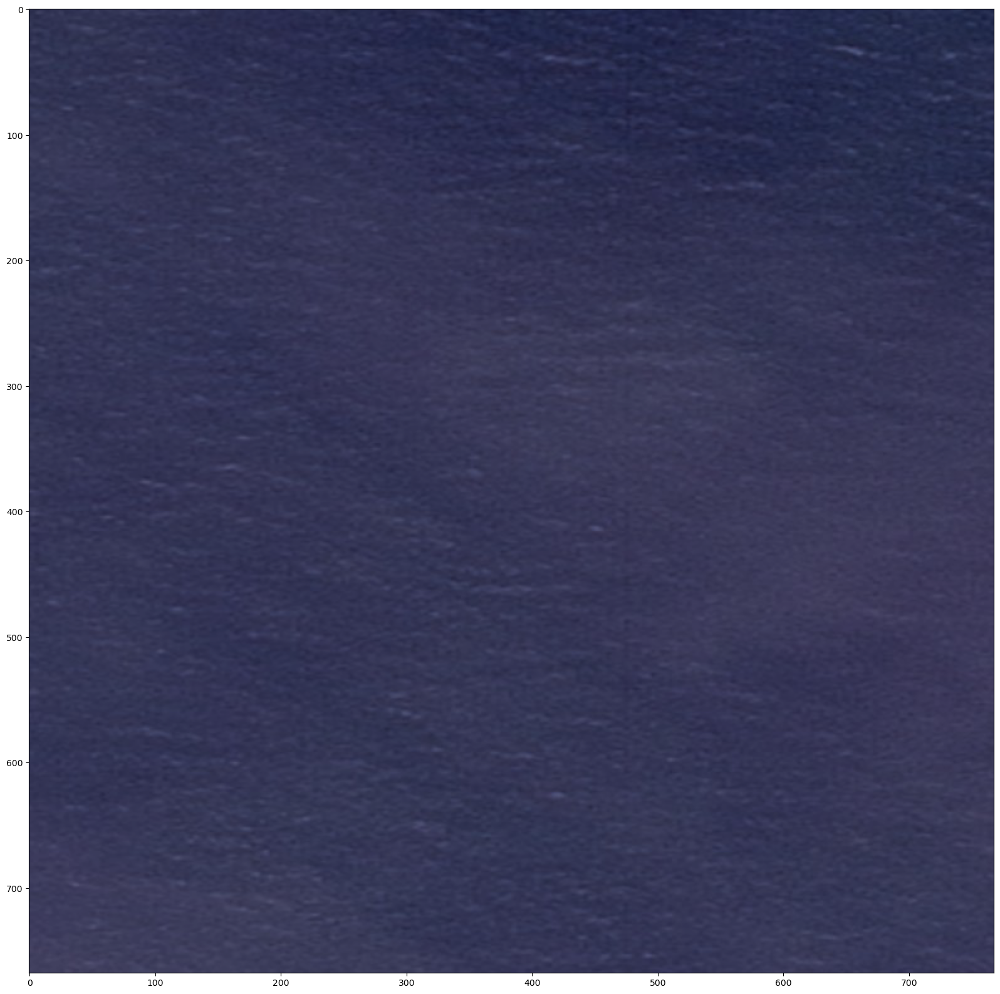

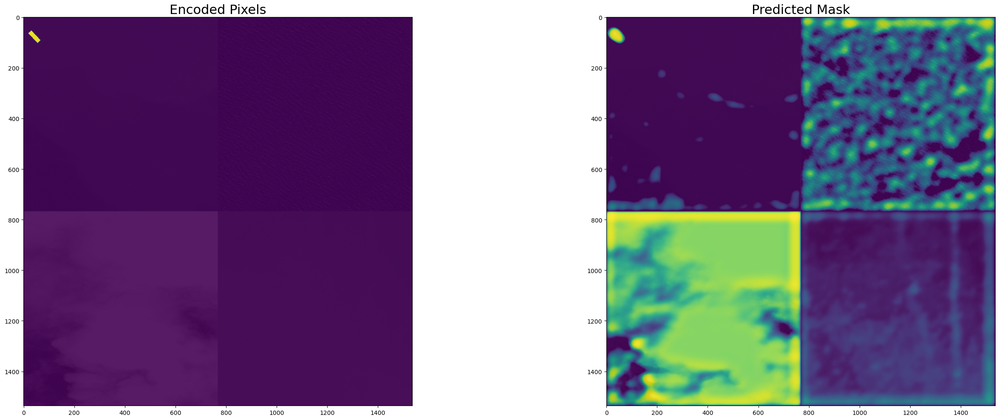

In [ ]:
plot_overlay(*next(test_gen))
X_test, y_test = next(test_gen)

img_m = X_test
mask_m = y_test[:,:,:,0]
out_m = model.predict(X_test)[:,:,:,0]
for i in np.arange(3):
    X_im, y_mask = next(test_gen)
    out_m = np.append(out_m, model.predict(X_im)[:,:,:,0], axis = 0)
    img_m = np.append(img_m, X_im, axis = 0)
    mask_m = np.append(mask_m, y_mask[:,:,:,0], axis = 0)
    print(i)

mont_img = np.stack((montage(img_m[:,:,:,0]),
                 montage(img_m[:,:,:,1]),
                 montage(img_m[:,:,:,2])), axis = -1)
mont_mask = montage(mask_m)
mont_pred = montage(out_m)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (30, 10))
ax1.imshow(mont_img)
ax1.imshow(mont_mask, alpha = 0.9)
ax1.set_title('Encoded Pixels', fontsize=22)

ax2.imshow(mont_img)
ax2.imshow(mont_pred, alpha = 0.9)
ax2.set_title('Predicted Mask', fontsize=22)
fig.tight_layout()

### 4. Analiza rezultata

Na osnovu dobijenih rezultata možemo zaključiti da detekcije brodova na slikama je moguć ali težak ML zadatak, koji zavisi od mnoštva faktora, neki od kojih su veličina ML mreže, kvalitet slika, kvalitet treninga, količina treninga. Takođe, u folderu sa slikama za trening postoji jako veliki broj slika koje nisu uopšte klasifikovane.

Što se tiče detekcije, obučavanjem algoritma postignuta je osrednja tačnost. Kako bi se postigao još bolji rezultat i unapredio proces, u budućnosti bi trebalo razmisliti o treniranju nad većom količinom podataka, augmentaciji podataka ili možda nešto drugo, koja predstavlja jednu od tehnika za evaluaciju detektora. Kako je za klasifikaciju korišćen UNET model, moguće poboljšanje bi se moglo desiti promenom strukture slojeva ili broja čvorova u svakom sloju.

### 5. Zaključak

Za razliku od sistema koji zadatak izvršava prateći izričita pravila, sistem

mašinskog učenja uči iz iskustva i primera. Sistem za mašinsko učenje će se poboljšati kako se u algoritam unosi veći broj podataka.

Mašinsko učenje je zanimljivo zbog svoje težnje da se približi ljudskom učenju po efikasnosti, kao i da ga objasni, odnosno pruži teorijski model za njega. Neka od najvažnijih pitanja mašinskog učenja su:
*   šta se može naučiti i pod kojim uslovima?
*   koji su algoritmi pogodni za koje vrste problema?

Odgovori na ova najvažnija pitanja leže u teoriji
modela učenja. Treba sagledati vrste zadataka učenja koje se često
pojavljuju. Neki od najčešćih zadataka učenja koji se javljaju u praksi su klasifikacija i detekcija.